# Coupled FHN model

In this notebook we want to explore coupled, excitable FitzHugh-Nagumo systems. First, in the context of spatial neares-neighbour, diffusion-like coupling of cells in the heart. And second, coupled on a random, directed network like neurons in the brain.

The general model is composed of two variables at each cell $i$, the (fast) activator $u_i$ and the inhibitor $v_i$, and reads

$$
\dot{u}_i=\alpha u_i (u_i-\beta)(1-u_i) - v_i  + \sum_{j}G_{ij}u_j+\eta_i\\
\dot{v}_i=\epsilon(u_i-v_i),
$$
where $\eta_i$ is a Gaussian noise that we only apply for the brain dynamics. 
Note that the parameters $\alpha$, $\beta$, and $\epsilon$ are homogeneous across cells, and the (spatial) coupling is only mediated via the acivators $u_i$.

In [1]:
import numpy as np 
import pickle

import matplotlib.pyplot as plt

import os, sys
rootpath = os.path.join(os.getcwd(), '..')
sys.path.append(rootpath)

import networkx as nx

import jax
import jax.numpy as jnp
import jax.random as jr
from jax.experimental import sparse

import diffrax
from diffrax import diffeqsolve, ODETerm, ControlTerm, MultiTerm, VirtualBrownianTree, SaveAt, ShARK
from tqdm.notebook import tqdm

import lineax

In [2]:
## Run this line only if you have installed jax with cuda and there is a GPU in your machine but you anyway want to use the CPU instead 
#jax.config.update('jax_platform_name', 'cpu')

# before execute any computation / allocation
print(jax.numpy.ones(3).device)

cuda:0


## Nullclines and Parameter Exploration

In [3]:
def FHN(t, y, return_nullclines=False):
    print(t,end='\r')
    u = y[:N]
    v = y[N:]
    du = a*u*(u-b)*(1-u) + G.dot(u) - v
    dv = e*(u-v)
    return np.append(du,dv)

Plot the nullclines in phase space

(-0.6, 1.2)

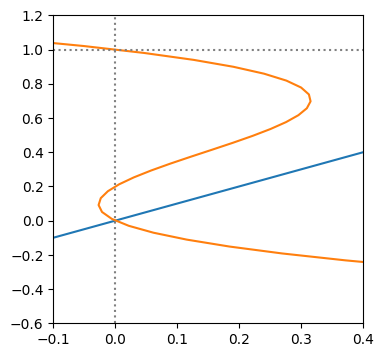

In [4]:
u_array = np.linspace(-1,3,100)
fig, ax = plt.subplots(1,1,figsize=(4,4))
ax.plot(u_array,u_array)
e = 0.05 
a, b = (3, 0.2)
ax.plot(a*u_array*(u_array-b)*(1-u_array), u_array)
ax.axvline(0, c='grey', ls=':')
ax.axhline(1, c='grey', ls=':')
ax.set_xlim(-0.1,.4)
ax.set_ylim(-.6,1.2)

# Directed Network Coupling (🧠)

To simulate neuronal dynamics in the brain, we i) choose the coupling $G_{ij}$ to represent a directed ER graph with weak, random (but homogeneous) coupling strengths, and ii) we simulate a constant Gaussian noise $\eta_i$ for each neuron emulating the constant fluctuating input from other brain areas. 

In [2]:
#random network implementation
def random_graph(N, k, J, seed=100, weights='homogeneous', weight_generator=None):
    '''
    Creates a random, directed, and weighted Erdos Renyi graph.
    Parameters:
        N: number of nodes
        k: mean nodal degree
        J: weight parameters. If homogeneous weights: constant float, if gaussian weigts: J=(J_mean, J_sigma)
        seed: seed for the ER graph generation
        weights: Type of weights, 'homogeneous' or 'gaussian'
        generator: random generator for random weights
    Returns:
        sparse jax.experimental coupling matrix 
    '''
    p = k / (N - 1)
    
    # Create ER graph
    G = nx.erdos_renyi_graph(N, p, directed=True, seed=seed)
    
    # Put weights
    for u, v in G.edges():
        if weights=='homogeneous':
            G[u][v]['weight'] = J#generator.normal(J, J/5)
        elif weights=='gaussian':
            G[u][v]['weight'] = weight_generator.normal(J[0], J[1])
    
    # Get the adjacency matrix in sparse format
    adj_matrix = nx.adjacency_matrix(G, weight='weight')
    
    return sparse.BCSR.from_scipy_sparse(adj_matrix)

In [3]:
# Deterministic part of the differential equation
def FHN_graph(t, y, args):
    N, a, b, e, Du, L, _ = args 
    u = y[:N]
    v = y[N:]
    
    du = a*u*(u-b)*(1-u) + Du*(L@u) - v 
    
    dv = e*(u-v)

    return jnp.append(du,dv)

# Stochastic part of the differential equation
def FHN_graph_noise(t, y, args):
    N, _, _, _, _,_, noise_amp = args 
    noise = noise_amp*jnp.ones((2*N))
    noise = noise.at[N:].set(0)
    return lineax.DiagonalLinearOperator(noise)

In [6]:
N = 1000 # Put N here for jax to be able to JIT compile the solve_brain function pre-runtime. 
N_times = 2000 # output times. Again, here for JIT

# Solve the brain. Whouu!
@jax.jit
def solve_brain(L,y0='zeros',a=3,b=0.2,e=0.01,Du=.1,T=1000, noise_amp=.1, max_steps=1000000, solver=ShARK(),rtol=1e-2, atol=1e-4,dt0=1e-2, noise_tol=1e-4, pcoeff=0.1, icoeff=0.0, dcoeff=0):
    '''
    Takes in all simulation and solver parameters and returns a solution of the coupled SDEs
    Parameters:
        TODO
        
    Returns:
        diffrax.Solution object
    '''
    if type(y0) == str and y0=='zeros':
        y0 = jnp.zeros(2*N)
    
    if type(y0) == str and y0=='random':
        y0 = jax.random.normal(jr.PRNGKey(0), shape=(2*N,))*e
    
    deterministic_term = ODETerm(FHN_graph)
    brownian_path = VirtualBrownianTree(0., T, tol=noise_tol, shape=(2*N,), key=jr.PRNGKey(1),levy_area=diffrax.SpaceTimeLevyArea)
    noise_term = ControlTerm(FHN_graph_noise, brownian_path)
    terms = MultiTerm(deterministic_term, noise_term)

    saveat = SaveAt(ts=jnp.linspace(0, T, N_times))
    stepsize_controller = diffrax.PIDController(rtol=rtol, atol=atol, pcoeff=pcoeff, dcoeff=dcoeff, icoeff=icoeff)

    sol = diffeqsolve(terms, solver, t0=0, t1=T, dt0=dt0, y0=y0, args=(N,a,b,e,Du,L, noise_amp), saveat=saveat, max_steps=max_steps, progress_meter=diffrax.TqdmProgressMeter(), stepsize_controller=stepsize_controller)
    return sol

## Single simulation

In [3]:
# Parameters
# Random number generator in case we want gaussian weights
#single_random_generator = np.random.default_rng(0)
k=50
m=1.45 # Mean J/k
T=5000
N=1000
L=random_graph(N,k,J=m/k, weights='homogeneous')#, weight_generator=single_random_generator)

C:\Users\pelli\AppData\Local\Temp\ipykernel_12280\1428128129.py:28: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  adj_matrix = nx.adjacency_matrix(G, weight='weight')


In [9]:
# Load in a sufficiently random initial state generated from an uncoupled system (code below)
random_initials = np.load('notebooks/simulation_data/brain_phase-transition_random_state_N{}.pkl'.format(N), allow_pickle=True)

In [7]:
sol = solve_brain(L,T=T, rtol=1e-2, atol=1e-3,dt0=1e-2, noise_tol=1e-4, solver=diffrax.ShARK())

100.00%|██████████| [40:14<00:00, 24.14s/%]


In [8]:
# for ease of notation
u_sol = sol.ys[:,:N].T  # u over time
v_sol = sol.ys[:,N:].T  # v over time

Export single state to be used as an initial state later on 

In [ ]:
if False: # Change to True. Added here to not accidentally overwrite data :)
    filepath = 'simulation_data/brain_phase-transition_random_state_N{}.pkl'.format(N)
    with open(filepath,'wb') as f:
        i = -1
        pickle.dump(sol.ys[i,:].T, f)

### Plot single simulation

Plot a kymograph of the neurons' activities

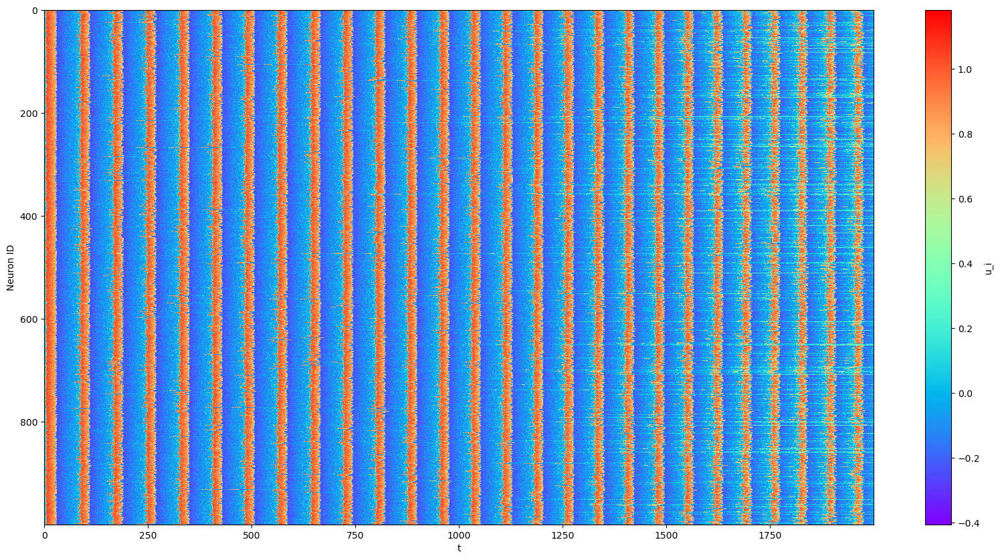

In [9]:
fig, ax = plt.subplots(1,1, figsize=(20, 10))
# Kymograph with timeseries of all neurons' activities (u)
im = ax.imshow(u_sol, aspect='auto', cmap='rainbow', interpolation='none')
ax.set_xlabel(r't')
ax.set_ylabel(r'Neuron ID')

# plot colorbar
cbar = fig.colorbar(im, ax=ax, label=r'u_i')

In [10]:
k=50
m=0.05 # Mean J/k
T=5000
L=random_graph(N,k,J=m/k, weights='homogeneous')#, weight_generator=single_random_generator)
sol2 = solve_brain(L,T=T, rtol=1e-2, atol=1e-3,dt0=1e-2, noise_tol=1e-4, solver=diffrax.ShARK())

C:\Users\pelli\AppData\Local\Temp\ipykernel_9484\1091974813.py:28: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  adj_matrix = nx.adjacency_matrix(G, weight='weight')
100.00%|██████████| [44:24<00:00, 26.64s/%]


In [13]:
u_sol2 = sol2.ys[:,:N].T  # u over time
v_sol2 = sol2.ys[:,N:].T  # v over time

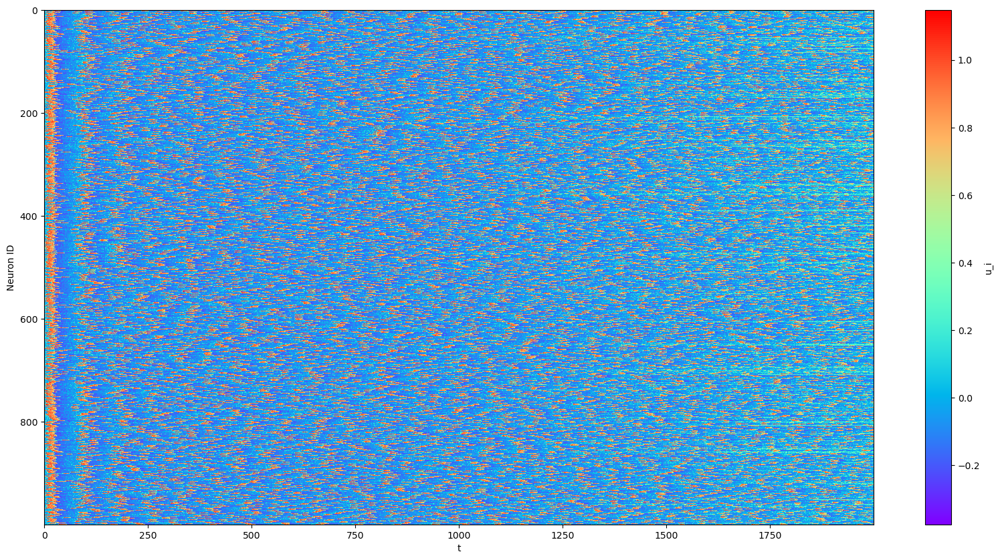

In [14]:
fig, ax = plt.subplots(1,1, figsize=(20, 10))
# Kymograph with timeseries of all neurons' activities (u)
im = ax.imshow(u_sol2, aspect='auto', cmap='rainbow', interpolation='none')
ax.set_xlabel(r't')
ax.set_ylabel(r'Neuron ID')

# plot colorbar
cbar = fig.colorbar(im, ax=ax, label=r'u_i')

In [32]:
u_solutions = [u_sol2[:, 250:1300], u_sol[:,250:1300]]
m_array = [0.05, 1.45]

In [ ]:
import matplotlib.gridspec as gridspec

plt.rcParams.update({'font.size': 16})

vfig = plt.figure(figsize=(30, 10))
gs = gridspec.GridSpec(2, 3, height_ratios=[1, 0.2], width_ratios=[1, 0.05, 1], wspace=0.3)

ax_kymo1 = vfig.add_subplot(gs[0, 0])
ax_kymo2 = vfig.add_subplot(gs[0, 2])
ax_EEG1 = vfig.add_subplot(gs[1, 0])
ax_EEG2 = vfig.add_subplot(gs[1, 2])
ax_colorbar = vfig.add_subplot(gs[:, 1])

for i, ax_kymo, ax_EEG in zip((0, len(u_solutions) // 2 - 2, len(u_solutions) - 1), [ax_kymo1, ax_kymo2], [ax_EEG1, ax_EEG2]):
    ax_kymo.set_title('m={}'.format(m_array[i]))
    # heatmap with all neurons timeseries x:t, y:neuron_id
    im = ax_kymo.imshow(u_solutions[i], aspect='auto', cmap='rainbow', interpolation='none')
    ax_kymo.set_xlabel(r'time (a.u.)')
    ax_kymo.set_ylabel(r'Neuron ID')

    # plot EEG
    full_EEG = u_solutions[i].sum(axis=0)
    sampled_EEG = u_solutions[i][np.random.randint(0, N, size=100)].sum(axis=0)
    ax_EEG.plot(full_EEG)
    ax_EEG.set_xlabel(r'time (a.u.)')
    ax_EEG.set_ylabel(r'$\sum_i v_i$')

# plot a single vertical colorbar
cbar = vfig.colorbar(im, cax=ax_colorbar, orientation='vertical', shrink=0.3)
vfig.tight_layout()

Plot the 'EEG'

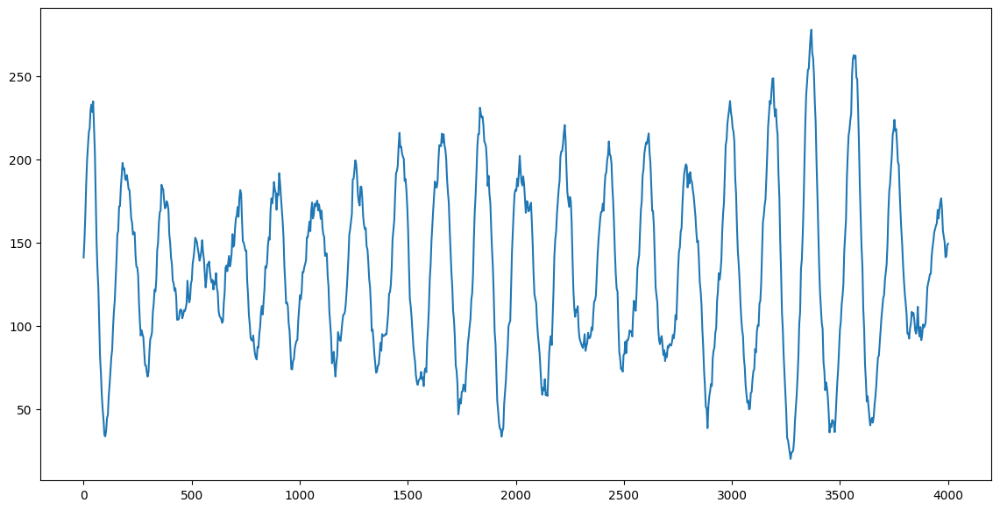

In [ ]:
fig, ax = plt.subplots(1,1, figsize=(14, 7))

full_EEG = u_sol.sum(axis=0)
sampled_EEG = u_sol[np.random.randint(0,N,size=100)].sum(axis=0)
ax.plot(sol.ts, full_EEG)
ax.set_xlabel(r't')
ax.set_ylabel(r'$\mathrm{EEG}=\sum_i u_i$')


# Phase Transition

### Simulate a range of parameters

In [4]:

from jax import random, jit, lax
# Euler-Maruyama implementation
k=50
m=1.45 # Mean J/k
L= random_graph(N, k, J=m/k, weights='homogeneous')
N = 1000 # Put N here for jax to be able to JIT compile the solve_brain function pre-runtime. 


def FHN_step(u, v, N, a, b, e, Du, sigma, L, key, delta_t):
    
    '''
    Perform a single step of the noisy FitzHugh-Nagumo model.
    Parameters:
    - u: state variable u
    - v: state variable v
    - N: number of nodes
    - a: parameter a
    - b: parameter b
    - e: parameter e giving the timescale separation between u and v
    - Du: Diffusion coefficient
    - sigma: noise intensity
    - L: Laplacian matrix
    - key: random key for noise generation
    - delta_t: time step
    Returns:
    - u_new: updated state variable u
    - v_new: updated state variable v
    '''
    # Generate Gaussian noise for each element of h
    noise = random.normal(key, u.shape)
    
    du = a * u * (u - b) * (1 - u) +Du * (L @ u) - v 
    dv = e * (u - v)
    u_new = u + du * delta_t + jnp.sqrt(delta_t * sigma**2) * noise
    v_new = v + dv * delta_t

    return u_new, v_new


def run_simulation(N=N, y0='zeros', a=3, b=0.2, e=1e-2, Du=0.1, J=L, sigma=0.1, delta_t=0.1, total_time=3000.0, key=random.PRNGKey(0)):
    if y0=='zeros':
        y0 = jnp.zeros(2*N)
    
    if type(y0) == str and y0=='random':
        y0 = random.normal(random.PRNGKey(0), shape=(2*N,))*e
     
    # Calculate the number of steps based on the total time and delta_t
    num_steps = int(total_time / delta_t)

    # Initialize state variables
    u = y0[:N]
    v = y0[N:]

    # Define the scan function
    def scan_fn(carry, step):
        u, v, key = carry
        key, subkey = random.split(key)
        u, v = FHN_step(u, v, N, a, b, e, Du, sigma, L, subkey, delta_t)
        return (u, v, key), (u, v)

    # Run the scan function
    (u, v, _), (u_trajectory, v_trajectory) = lax.scan(scan_fn, (u, v, key), None, length=num_steps)
    u_trajectory=u_trajectory[::10]
    v_trajectory=v_trajectory[::10]

    return u_trajectory, v_trajectory



C:\Users\pelli\AppData\Local\Temp\ipykernel_12280\1428128129.py:28: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  adj_matrix = nx.adjacency_matrix(G, weight='weight')


In [9]:
m_array = np.arange(0,1.5,.05)

random_generator = np.random.default_rng(0)
N = 1000
k = 50
T = 6000
t_steps = 6000

In [18]:
u_solutions = np.empty((len(m_array),N, t_steps))
for i,m in enumerate(m_array):
    L=random_graph(N,k,J=m/k)
    print("{}/{}, m={}".format(i+1,len(m_array), m))
    ##sol = solve_brain(L,T=T,rtol=1e-2, atol=1e-3,dt0=1e-2, noise_tol=1e-4, solver=diffrax.ShARK()) #y0=np.append(random_generator.uniform(0,0.4, size=N), (random_generator.integers(0,2, size=N))*1)
    u_sol, v_sol= run_simulation(N=N,J=L, a=3, b=0.2, e=0.01, Du=0.1, sigma=0.1, total_time=T, key=random.PRNGKey(int(m*100+1)))
    u_solutions[i] = u_sol.T # u over time

C:\Users\pelli\AppData\Local\Temp\ipykernel_36264\1428128129.py:28: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  adj_matrix = nx.adjacency_matrix(G, weight='weight')


1/30, m=0.0


C:\Users\pelli\AppData\Local\Temp\ipykernel_36264\1428128129.py:28: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  adj_matrix = nx.adjacency_matrix(G, weight='weight')


2/30, m=0.05


C:\Users\pelli\AppData\Local\Temp\ipykernel_36264\1428128129.py:28: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  adj_matrix = nx.adjacency_matrix(G, weight='weight')


3/30, m=0.1


C:\Users\pelli\AppData\Local\Temp\ipykernel_36264\1428128129.py:28: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  adj_matrix = nx.adjacency_matrix(G, weight='weight')


4/30, m=0.15000000000000002


C:\Users\pelli\AppData\Local\Temp\ipykernel_36264\1428128129.py:28: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  adj_matrix = nx.adjacency_matrix(G, weight='weight')


5/30, m=0.2


C:\Users\pelli\AppData\Local\Temp\ipykernel_36264\1428128129.py:28: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  adj_matrix = nx.adjacency_matrix(G, weight='weight')


6/30, m=0.25


C:\Users\pelli\AppData\Local\Temp\ipykernel_36264\1428128129.py:28: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  adj_matrix = nx.adjacency_matrix(G, weight='weight')


7/30, m=0.30000000000000004


C:\Users\pelli\AppData\Local\Temp\ipykernel_36264\1428128129.py:28: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  adj_matrix = nx.adjacency_matrix(G, weight='weight')


8/30, m=0.35000000000000003


C:\Users\pelli\AppData\Local\Temp\ipykernel_36264\1428128129.py:28: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  adj_matrix = nx.adjacency_matrix(G, weight='weight')


9/30, m=0.4


C:\Users\pelli\AppData\Local\Temp\ipykernel_36264\1428128129.py:28: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  adj_matrix = nx.adjacency_matrix(G, weight='weight')


10/30, m=0.45


C:\Users\pelli\AppData\Local\Temp\ipykernel_36264\1428128129.py:28: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  adj_matrix = nx.adjacency_matrix(G, weight='weight')


11/30, m=0.5


C:\Users\pelli\AppData\Local\Temp\ipykernel_36264\1428128129.py:28: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  adj_matrix = nx.adjacency_matrix(G, weight='weight')


12/30, m=0.55


C:\Users\pelli\AppData\Local\Temp\ipykernel_36264\1428128129.py:28: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  adj_matrix = nx.adjacency_matrix(G, weight='weight')


13/30, m=0.6000000000000001


C:\Users\pelli\AppData\Local\Temp\ipykernel_36264\1428128129.py:28: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  adj_matrix = nx.adjacency_matrix(G, weight='weight')


14/30, m=0.65


C:\Users\pelli\AppData\Local\Temp\ipykernel_36264\1428128129.py:28: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  adj_matrix = nx.adjacency_matrix(G, weight='weight')


15/30, m=0.7000000000000001


C:\Users\pelli\AppData\Local\Temp\ipykernel_36264\1428128129.py:28: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  adj_matrix = nx.adjacency_matrix(G, weight='weight')


16/30, m=0.75


C:\Users\pelli\AppData\Local\Temp\ipykernel_36264\1428128129.py:28: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  adj_matrix = nx.adjacency_matrix(G, weight='weight')


17/30, m=0.8


C:\Users\pelli\AppData\Local\Temp\ipykernel_36264\1428128129.py:28: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  adj_matrix = nx.adjacency_matrix(G, weight='weight')


18/30, m=0.8500000000000001


C:\Users\pelli\AppData\Local\Temp\ipykernel_36264\1428128129.py:28: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  adj_matrix = nx.adjacency_matrix(G, weight='weight')


19/30, m=0.9


C:\Users\pelli\AppData\Local\Temp\ipykernel_36264\1428128129.py:28: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  adj_matrix = nx.adjacency_matrix(G, weight='weight')


20/30, m=0.9500000000000001


C:\Users\pelli\AppData\Local\Temp\ipykernel_36264\1428128129.py:28: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  adj_matrix = nx.adjacency_matrix(G, weight='weight')


21/30, m=1.0


C:\Users\pelli\AppData\Local\Temp\ipykernel_36264\1428128129.py:28: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  adj_matrix = nx.adjacency_matrix(G, weight='weight')


22/30, m=1.05


C:\Users\pelli\AppData\Local\Temp\ipykernel_36264\1428128129.py:28: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  adj_matrix = nx.adjacency_matrix(G, weight='weight')


23/30, m=1.1


C:\Users\pelli\AppData\Local\Temp\ipykernel_36264\1428128129.py:28: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  adj_matrix = nx.adjacency_matrix(G, weight='weight')


24/30, m=1.1500000000000001


C:\Users\pelli\AppData\Local\Temp\ipykernel_36264\1428128129.py:28: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  adj_matrix = nx.adjacency_matrix(G, weight='weight')


25/30, m=1.2000000000000002


C:\Users\pelli\AppData\Local\Temp\ipykernel_36264\1428128129.py:28: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  adj_matrix = nx.adjacency_matrix(G, weight='weight')


26/30, m=1.25


C:\Users\pelli\AppData\Local\Temp\ipykernel_36264\1428128129.py:28: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  adj_matrix = nx.adjacency_matrix(G, weight='weight')


27/30, m=1.3


C:\Users\pelli\AppData\Local\Temp\ipykernel_36264\1428128129.py:28: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  adj_matrix = nx.adjacency_matrix(G, weight='weight')


28/30, m=1.35


C:\Users\pelli\AppData\Local\Temp\ipykernel_36264\1428128129.py:28: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  adj_matrix = nx.adjacency_matrix(G, weight='weight')


29/30, m=1.4000000000000001


C:\Users\pelli\AppData\Local\Temp\ipykernel_36264\1428128129.py:28: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  adj_matrix = nx.adjacency_matrix(G, weight='weight')


30/30, m=1.4500000000000002


Save data

In [19]:
filepath = 'data/brain_phase-transition_homogeneousJ.pkl'
with open(filepath,'wb') as f:
    pickle.dump(u_solutions, f)
    

### Analyse range of parameters

Load data

In [5]:
u_solutions_loaded = np.load('data/brain_phase-transition_homogeneousJ.pkl',allow_pickle=True)

In [6]:
u_solutions = u_solutions_loaded

In [7]:
print(u_solutions.shape)

(30, 1000, 6000)


Plot single simulation to check the data

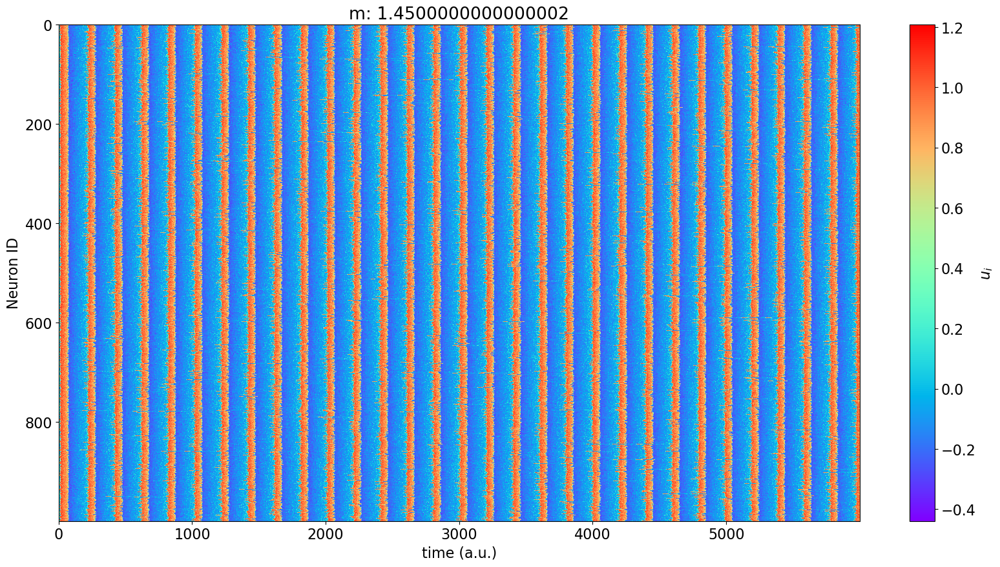

In [26]:
simulation_id = 29 # which simulation to look at
m_array = np.arange(0,1.5,.05)
plt.rcParams.update({'font.size': 16})

fig, ax = plt.subplots(1,1, figsize=(20, 10))

# Kymograph with timeseries of all neurons' activities (u)
im = ax.imshow(u_solutions[simulation_id], aspect='auto', cmap='rainbow', interpolation='none')
ax.set_xlabel(r'time (a.u.)')
ax.set_ylabel(r'Neuron ID')
ax.set_title(f'm: {m_array[simulation_id]}')

# plot colorbar
cbar = fig.colorbar(im, ax=ax, label=r'$u_i$')

### Qualitative look at the phase transition

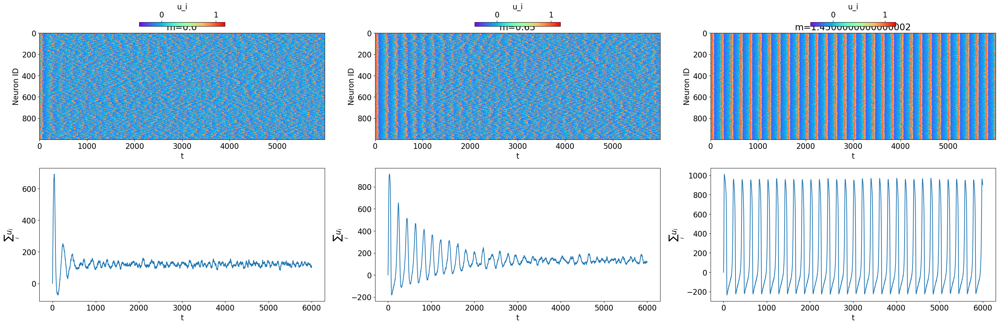

In [26]:
fig, (ax_kymographs,ax_EEGs) = plt.subplots(2,3, figsize=(30, 10))

for i, ax_kymo, ax_EEG in zip((0,len(u_solutions)//2-2,len(u_solutions)-1), ax_kymographs, ax_EEGs):
    ax_kymo.set_title('m={}'.format(m_array[i]))
    # heatmap with all neurons timeseries x:t, y:neuron_id
    im = ax_kymo.imshow(u_solutions[i], aspect='auto', cmap='rainbow', interpolation='none')
    ax_kymo.set_xlabel(r't')
    ax_kymo.set_ylabel(r'Neuron ID')

    # plot colorbar
    cbar = fig.colorbar(im, ax=ax_kymo,location='top',shrink=0.3, label=r'u_i')

    # plot EEG
    full_EEG = u_solutions[i].sum(axis=0)
    sampled_EEG = u_solutions[i][np.random.randint(0,N,size=100)].sum(axis=0)
    ax_EEG.plot(full_EEG)
    ax_EEG.set_xlabel(r't')
    ax_EEG.set_ylabel(r'$\sum_i u_i$')
fig.tight_layout()

In [ ]:
fig.savefig('figures/brain_phase-transition-kymos_homoogeneousJ.pdf')

### Quantify the phase transition
By mean and max of EEG

In [ ]:
all_full_EEGs = u_solutions_loaded[:,:,2000:].sum(axis=1)
mean_EEG = all_full_EEGs.mean(axis=1)
max_EEG = all_full_EEGs.max(axis=1)

NameError: name 'mean_EEG' is not defined

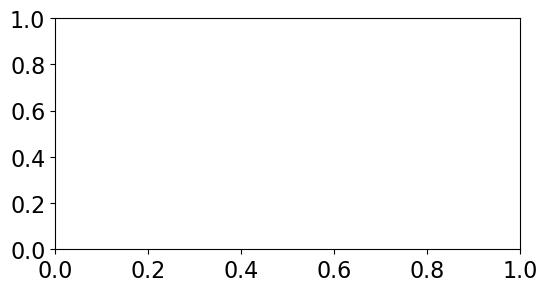

In [14]:
fig, ax = plt.subplots(1,1, figsize=(6,3))

ax.plot(m_array, mean_EEG, label='Mean of EEG')
ax.plot(m_array, max_EEG, label='Max of EEG')

ax.legend(frameon=False)
ax.set_xlabel(r'$m=J \cdot k $')
fig.tight_layout()

In [29]:
fig.savefig('figures/brain_phase-transition_homoogeneousJ.pdf')

By power spectrum entropy

In [11]:
@jax.jit
def calculate_entropy(power_spectrum):
    epsilon = 1e-12  # Small constant to prevent division by zero
    power_spectrum /= jnp.sum(power_spectrum) + epsilon  # Normalize power spectrum
    entropy = -jnp.sum(power_spectrum * jnp.log(power_spectrum + epsilon))  # Calculate entropy
    return jnp.abs(entropy), power_spectrum  # Ensure entropy is not negative

@jax.jit
def process_element(array, i):
    fft_result = jnp.fft.fft(array[i, :])
    fft_result_shifted = jnp.fft.fftshift(fft_result)  # Shift the zero-frequency component to the center
    power_spectrum = jnp.abs(fft_result_shifted) ** 2
    entropy, power_spectrum = calculate_entropy(power_spectrum)
    return entropy

def average_entropy(array):
    N, T = array.shape
    
    # Vectorized processing of all elements
    vectorized_process = jax.vmap(lambda i: process_element(array, i))(jnp.arange(N))
    
    average_entropy = jnp.mean(vectorized_process)
    return average_entropy

In [12]:
entropies = np.array([average_entropy(u_solution[:,2000:]) for u_solution in u_solutions])

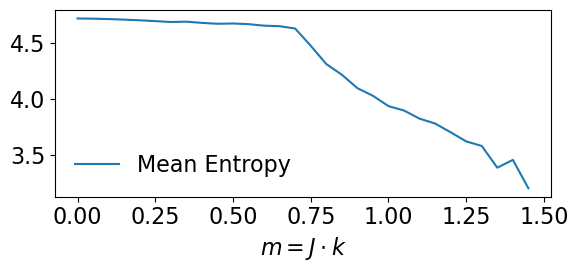

In [13]:
fig, ax = plt.subplots(1,1, figsize=(6,3))

ax.plot(m_array, entropies, label='Mean Entropy')
ax.legend(frameon=False)
ax.set_xlabel(r'$m=J\cdot k$')
fig.tight_layout()

In [15]:
fig.savefig('figures/brain_phase-transition-entropy_homoogeneousJ.pdf')

By entropy of the average, binarized rate levels

In [17]:
# functiom to calculate the rate of u by thresholding

def threshold_matrix(matrix: jnp.ndarray, threshold: float) -> jnp.ndarray:
    """
    Scans a JAX matrix and returns a binary matrix where elements above 
    the threshold are 1 and elements below or equal to the threshold are 0.
    
    Parameters:
    matrix (jnp.ndarray): Input JAX matrix.
    threshold (float): Threshold value.
    
    Returns:
    jnp.ndarray: A binary matrix of the same shape as the input.
    """
    # Use jax.numpy.where to create a binary matrix
    return jnp.where(matrix > threshold, 1, 0)

# calculate the pmf of the average rate 

def calculate_pmf(array):
    """
    Returns the probability mass function (pmf) of the input array.
    
    Parameters:
        array (numpy.ndarray): Input array of data.
    
    Returns:
        numpy.ndarray: The unique values of the array 
        numpy.ndarray: The pmf of the input array.

    """
    
    # Calculate frequencies
    unique, counts = jnp.unique(array, return_counts=True)
    frequencies = counts / len(array)
    
    return unique, frequencies

def entropy_pmf(data):
    '''
    Calculate the entropy of a dataset with discrete values.
    Parameters:
    data (jax.numpy.ndarray): dataset with discrete values.
    Returns:
    float: The entropy of the pmf of the dataset.
    '''
    _, prob=calculate_pmf(data)
    epsilon = 1e-12  # Small constant to prevent division by zero
    
    entropy = -jnp.sum(prob * jnp.log2(prob + epsilon))  # Calculate entropy
    return jnp.abs(entropy)  # Ensure entropy is not negative


Rate levels for some sample simulations

(30, 4000)


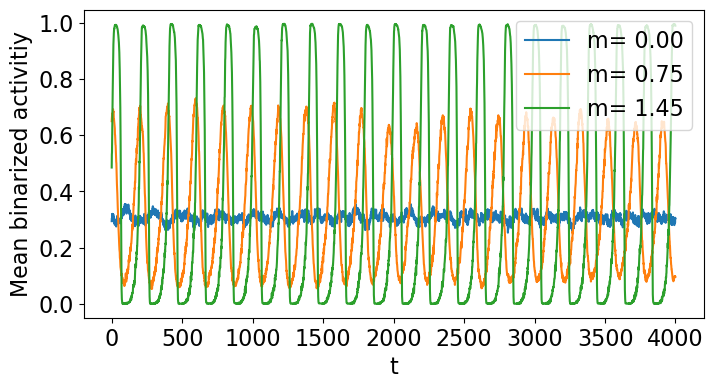

In [23]:
threshold = 0.05 #The actual excitation threshold is way lower than 0.5, I would use 0.05
binarized = threshold_matrix(u_solutions_loaded[:,:,2000:], threshold)

means = binarized.mean(axis=1)
print(means.shape)
fig, ax = plt.subplots(1,1, figsize=(8,4))
simulation_ids = (0,15,29)
##ax.plot(means[simulation_ids, :].T)

ax.set_xlabel(r't')
ax.set_ylabel(r'Mean binarized activitiy')
for idx in simulation_ids:
    ax.plot(means[idx, :], label=f'm= {m_array[idx]:.2f}')
ax.legend()

Probability mass function for sample simulation

Text(0, 0.5, 'PMF')

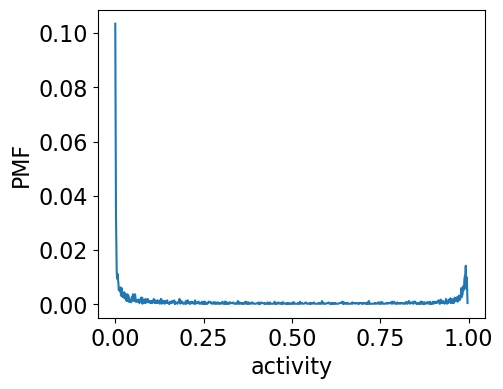

In [25]:

simulation_id =29
unique_values, pmf = calculate_pmf(means[simulation_id])

fig, ax = plt.subplots(1,1, figsize=(5,4))
ax.plot(unique_values, pmf)
ax.set_xlabel(r'activity')
ax.set_ylabel(r'PMF')

Calculate and plot the entropies

Text(0, 0.5, 'Entropy')

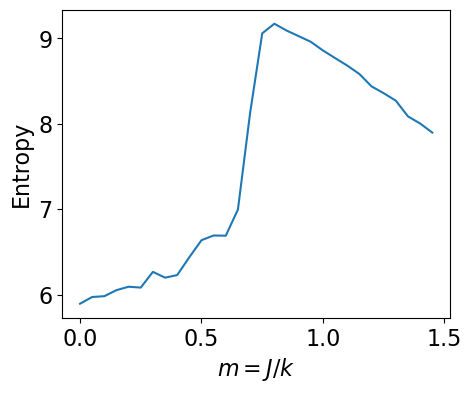

In [27]:
entropies = [entropy_pmf(mean) for mean in means]

fig, ax = plt.subplots(1,1, figsize=(5,4))
ax.plot(m_array, entropies)
ax.set_xlabel(r'$m=J/k$')
ax.set_ylabel(r'Entropy')

# Kuramoto
New code with Hilbert transform. You have to take care that you compute the Hilbert transform for **YOUR ENTIRE TIME SERIES** but then compute kuramoto order parameter only for the times **after equilibration**.

In [ ]:
# Function to compute the phase of each element across time using the Hilbert transform
from scipy.signal import hilbert
def compute_phases(data):
    """
    Compute the phase of each element using the Hilbert transform.
    
    Parameters:
        data (np.ndarray): An (N, T) array where N is the number of elements and T is the time dimension.
        
    Returns:
        np.ndarray: An (N, T) array containing the phases.
    """
    # Apply Hilbert transform along the time axis
    analytic_signal = hilbert(data, axis=1)
    # Extract the phase of the analytic signal
    phases = np.angle(analytic_signal)
    return phases


def kuramoto_order_parameter(phases):
    """
    Compute the Kuramoto order parameter for the given phases.
    
    Parameters:
        phases (jnp.ndarray): An (N, T) array of phases for N elements over T time points.
        
    Returns:
        tuple:
            - jnp.ndarray: A (T,) array representing the amplitude of the Kuramoto order parameter over time.
            - jnp.ndarray: A (T,) array representing the phase of the Kuramoto order parameter over time.
    """
    N = phases.shape[0]
    
    order_parameter_complex = jnp.sum(jnp.exp(1j * phases), axis=0) / N
    
    amplitude = jnp.abs(order_parameter_complex)
   
    phase = jnp.angle(order_parameter_complex)
    return amplitude, phase

# Pattern entropy

this is the function that I am currently using. It calculates the entropy of a sumatrix of my binarised array, usually 9 or 16 lattice sites/neurons are more than enough. Then I have hanother function which splits my simulation frame into submatrices of the desired length and another that binarises the array and selects only the timesteps after equilibration of the lattice sites which are not affected by boundary effects§: I put it also here but ofc you don't have a squared frame so you would have to figure out stuff differently.

In [ ]:
# normalisation wrt to total number of possible patterns, right one

def calculate_entropy_jax(binary_arrays, s, size=None):
    """
    Calculate the entropy of the patterns contained in a set of binary arrays.
    Parameters:
        binary_arrays (jax.numpy.ndarray): A 2D array of binary arrays (N, T).
        s (int): The length of each binary array.
    Returns:
        tuple: A tuple containing:
            - float: The entropy of the binary arrays.
            - float: The normalized entropy of the binary arrays.
    """
    # Calculate the number of unique patterns and their counts
    unique_patterns, counts = jnp.unique(binary_arrays, axis=1, return_counts=True, size=size)
    total_patterns = jnp.sum(counts)


    probabilities = (counts+1) / (total_patterns+2**s)
    unobserved= 2**s- len(counts)
    # Compute entropy using JAX
    entropy_obs = -jnp.sum(probabilities * jnp.log2(probabilities))
    entropy_un=-unobserved/(total_patterns+2**s)*jnp.log2(1/(total_patterns+2**s))
    entropy=entropy_obs+entropy_un
    print(jnp.sum(probabilities+unobserved/(total_patterns+2**s) ))
    # Normalize entropy
    N = binary_arrays.shape[0]  # Length of each binary array
    max_entropy = N  # Maximum entropy for binary arrays of length N
    normalized_entropy = entropy / max_entropy

    return entropy, normalized_entropy


In [ ]:
def entropycalc(array, s):
    """
    This function binarizes the input array based on a threshold value, reshapes it, 
    and then calculates the entropy and normalized entropy using the `calculate_entropy_jax` function.


    Parameters:
    array (ndarray): The input array to be binarized and analyzed.
    s (int): The size parameter used for reshaping the array (length of one side of the box).

    Returns:
    tuple: A tuple containing:
        - entropy (float): The calculated entropy of the binarized array.
        - normalised (float): The normalized entropy of the binarized array.
    """
    threshold = 0.08
    binary_u = jnp.where(array > threshold, 1, 0)
    binary_u=binary_u.reshape(s**2, -1)
    binary_u=binary_u[:, 1300:]
    entropy, normalised=calculate_entropy_jax(binary_u,s*s, 1)
    return entropy, normalised

In [ ]:
from jax import lax, vmap

def split_and_calculate_entropy(array, frame_size=4):
    """
    Splits the input array into smaller frames of size (frame_size, frame_size, T)
    and calculates the entropy for each frame using the entropycalc function.
    
    Parameters:
        array (jnp.ndarray): Input array of shape (N1, N1, T).
        frame_size (int): Size of the smaller frames. Default is 4.
        
    Returns:
        jnp.ndarray: Array of entropies for each frame.
        jnp.ndarray: Array of normalized entropies for each frame.
    """
    N, _, T = array.shape
    num_frames = (N // frame_size) ** 2


    def calculate_entropy_for_frame(i, j):
        
        frame = lax.dynamic_slice(array, (i, j, 0), (frame_size, frame_size, T))
        return entropycalc(frame, frame_size)

    indices = jnp.arange(0, N, frame_size)
    
    entropies, normalized_entropies = vmap(
        lambda i: vmap(lambda j: calculate_entropy_for_frame(i, j))(indices)
    )(indices)

    return jnp.mean(entropies), jnp.mean(normalized_entropies)
